In [1]:
import fastai
from fastai import *          # Quick access to most common functionality
from fastai.vision import *   # Quick access to computer vision functionality
import pytorch_ssim as ssim
from superres import *

In [2]:
path = Path('/DATA/WAMRI/SALK/uri/Image_restoration_data/')
train_lr = path/'train_LR'
train_hr = path/'train_HR'
test_lr = path/'test_LR'
test_hr = path/'test_HR'

In [3]:
def pull_id(fn):
    return fn.split('#')[-1].split('.')[0]

def match_hr_fn(x):
    return hr_names_by_id[pull_id(x.name)]

lr_names_full = list(train_lr.glob('*.tif'))
lr_names_full.sort()
hr_names_by_id = {pull_id(hrfn.name):hrfn for hrfn in train_hr.glob('*.tif')}

In [4]:
valid_pct = 0.10
src = (SuperResItemList(lr_names_full).
       random_split_by_pct(valid_pct).
       label_from_func(match_hr_fn))   

def get_data(src, bs, sz_lr, scale=4, tfms=None, **kwargs):
    sz_hr = sz_lr*scale
    salk_stats = ( [0.10], [0.20])
    if tfms is None: tfms = get_transforms() 
    data = (src.transform(tfms, size=sz_lr)
            .transform_labels(size=sz_hr)
            .databunch(bs=bs, **kwargs) #, num_workers=0)
            .normalize(salk_stats, do_y=True))
    return data

In [5]:
ssim_loss = ssim.SSIM(mult=-1.)
ssim_loss_2 = ssim.SSIM(window_size=3, mult=-1.)
ssim_loss_3 = ssim.SSIM(window_size=32, mult=-1.)

def combo_loss(pred, targs):
    return (3 + 
            ssim_loss(pred, targs) + 
            ssim_loss_2(pred, targs) + 
            ssim_loss_3(pred, targs) + 
            F.mse_loss(pred, targs)
           )
    #return ssim_loss(pred, targs) + psnr_loss(pred, targs)/50. # + F.l1_loss(pred, targs)
    
metrics = [F.mse_loss, 
           ssim.ssim,
           partial(ssim.ssim, window_size=3),
           partial(ssim.ssim, window_size=32),
           psnr]

In [6]:
n_feats = 8
n_res = 64
n_color = 1
scale=4

# 64,4,1
model = SrResnet(n_feats, n_res, n_color, scale)
model = nn.DataParallel(model).cuda()

In [7]:
bs = 16
lr_sz = 32
data = get_data(src, bs, lr_sz, scale=scale)

In [8]:
x,y = next(iter(data.train_dl))
x.shape, y.shape

(torch.Size([16, 1, 32, 32]), torch.Size([16, 1, 128, 128]))

In [9]:
learn = Learner(data, model, loss_func=combo_loss, metrics=metrics)

In [10]:
if False:
    learn.lr_find(end_lr=100)
    learn.recorder.plot()

In [12]:
lr = 5e-3
learn.fit_one_cycle(5, lr)
learn.save('enhance-db-1')
learn.recorder.plot_losses()
learn.fit_one_cycle(10, lr/10)
learn.save('enhance-db-1.1')
learn.recorder.plot_losses()

Total time: 01:09
epoch  train_loss  valid_loss  mse_loss  ssim  ssim  ssim  psnr                
1      2.130274    2.393918    0.397223  0.321008  0.354736  0.327561  4.019191  (00:13)
2      2.114151    2.457992    0.353150  0.285817  0.317894  0.291447  4.528619  (00:14)
3      2.099662    2.244836    0.295912  0.338856  0.366873  0.345348  5.298005  (00:14)
4      2.112689    2.080420    0.225045  0.373195  0.391309  0.380120  6.488503  (00:13)
5      2.100738    2.006658    0.189733  0.388341  0.399280  0.395454  7.230227  (00:13)



Total time: 02:18
epoch  train_loss  valid_loss  mse_loss  ssim  ssim  ssim  psnr                
1      2.073561    1.999152    0.183478  0.389356  0.398501  0.396468  7.375844  (00:13)
2      2.073412    2.000326    0.182827  0.388845  0.397698  0.395958  7.389905  (00:13)
3      2.073406    1.997141    0.184190  0.390190  0.399576  0.397283  7.357708  (00:14)
4      2.079178    1.994226    0.183257  0.390981  0.399974  0.398077  7.380114  (00:13)
5      2.085533    1.996479    0.184050  0.390295  0.399880  0.397397  7.362116  (00:13)
6      2.069633    1.994649    0.183261  0.390928  0.399662  0.398023  7.379625  (00:14)
7      2.069469    1.991020    0.180449  0.391477  0.399349  0.398604  7.446968  (00:13)
8      2.068439    1.991472    0.179552  0.391503  0.397939  0.398638  7.468222  (00:13)
9      2.070821    1.990215    0.179526  0.391306  0.399579  0.398426  7.468852  (00:13)
10     2.057034    1.989708    0.178739  0.391427  0.399049  0.398555  7.487915  (00:13)



In [24]:
bs = 16
lr_sz = 96
lr = 1e-3
data = get_data(src, bs, lr_sz, scale=scale)
learn = Learner(data, model, loss_func=combo_loss, metrics=metrics)
learn = learn.load('enhance-db-1.1')
learn.fit_one_cycle(10, lr)
learn.save('enhance-db-2')
learn.recorder.plot_losses()
learn.fit_one_cycle(10, lr/10)
learn.save('enhance-db-2.1')
learn.recorder.plot_losses()

Total time: 06:40
epoch  train_loss  valid_loss  mse_loss  ssim  ssim  ssim  psnr                
1      2.090945    2.061992    0.157205  0.353201  0.386046  0.355966  8.035655  (00:40)
2      2.074262    2.060309    0.153896  0.352803  0.385217  0.355568  8.127942  (00:39)
3      2.091586    2.062193    0.156165  0.352869  0.385469  0.355634  8.064445  (00:39)
4      2.082735    2.060276    0.154855  0.353046  0.385720  0.355814  8.100904  (00:40)
5      2.057961    2.061383    0.155915  0.352984  0.385803  0.355744  8.071332  (00:40)
6      2.051007    2.056982    0.152757  0.353481  0.386042  0.356251  8.160065  (00:39)
7      2.056352    2.060280    0.156243  0.353407  0.386381  0.356176  8.062198  (00:40)
8      2.067708    2.057790    0.153295  0.353422  0.385890  0.356193  8.144876  (00:40)
9      2.078959    2.058189    0.154062  0.353510  0.386085  0.356279  8.123191  (00:40)
10     2.075976    2.057784    0.153440  0.353464  0.385956  0.356235  8.140779  (00:40)



Total time: 46:04
epoch  train_loss  valid_loss  mse_loss  ssim  ssim  ssim  psnr                
1      1.815421    1.899662    0.190956  0.396864  0.496835  0.397595  7.191196  (04:36)
2      1.819555    1.898339    0.187583  0.396326  0.495859  0.397058  7.268105  (04:37)
3      1.814999    1.946444    0.217994  0.391147  0.488512  0.391891  6.615626  (04:36)
4      1.818773    1.897227    0.190266  0.397441  0.497429  0.398169  7.206666  (04:36)
5      1.823783    1.902784    0.193633  0.396706  0.496703  0.397440  7.130680  (04:36)
6      1.829743    1.894140    0.188617  0.397861  0.498029  0.398587  7.244630  (04:36)
7      1.842073    1.899417    0.188865  0.396393  0.495929  0.397125  7.238659  (04:36)
8      1.838106    1.896500    0.184500  0.395951  0.495364  0.396684  7.340147  (04:36)
9      1.824838    1.893506    0.185962  0.397249  0.497225  0.397981  7.306058  (04:36)
10     1.820759    1.894128    0.185433  0.396939  0.496689  0.397677  7.318214  (04:36)



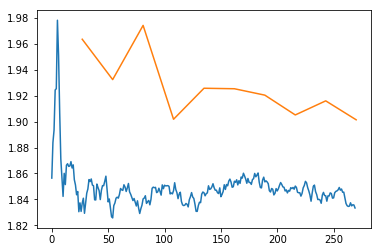

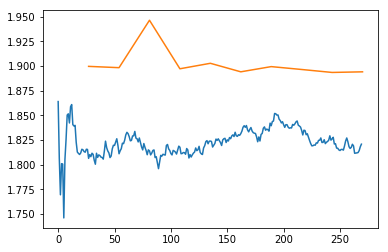

In [34]:
bs = 16
lr_sz = 288
lr = 1e-2
data = get_data(src, bs, lr_sz, scale=scale)
learn = Learner(data, model, loss_func=combo_loss, metrics=metrics)
learn = learn.load('enhance-db-2.1')
learn.fit_one_cycle(10, lr)
learn.save('enhance-db-3')
learn.recorder.plot_losses()
learn.fit_one_cycle(10, lr/10)
learn.save('enhance-db-3.1')
learn.recorder.plot_losses()

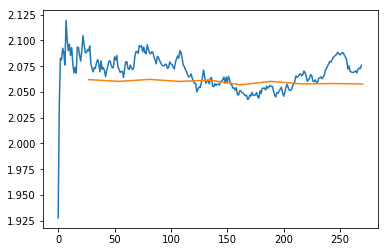

In [25]:
learn.recorder.plot_losses()

In [35]:
x,y = data.valid_ds[0]

In [50]:
trn_tfm, val_tfm = get_transforms()
test_bs = 4
test_sz = 512 
test_out_sz = 4*512

src = (SuperResItemList(lr_names_full).
       random_split_by_pct(valid_pct).
       label_from_func(match_hr_fn))

salk_stats = ( [0.10], [0.20])

test_data = (SuperResItemList.from_folder(path/'newman', extensions='.tif')
             .split_by_idx([])
             .label_from_func(lambda x: x)
             .transform([val_tfm,val_tfm], sz=test_sz)
             .transform_labels(size=test_out_sz)
             .databunch(bs=test_bs)
             .normalize(salk_stats, do_y=False))
    
test_learn = Learner(test_data, model, path='.').load('enhance-db-3.1')

In [51]:
imgs = list((path/'newman').glob('*.tif'))


def pred_and_save(img_fn):
    img = open_grayscale(img_fn)
    pred_img = test_learn.predict(img)
    img_min = pred_img.min()
    img_max = pred_img.max()
    pred_img = (pred_img - img_min) / (img_max - img_min)
    new_img = Image(pred_img[0])
    new_img.save(img_fn.name.replace('low res', 'super res'))
    return img, new_img
    
sr_images = []
orig_images = []
for img_fn in imgs:
    orig_img, new_img = pred_and_save(img_fn)
    sr_images.append(new_img)    
    orig_images.append(orig_img)

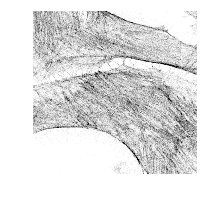

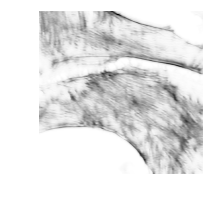

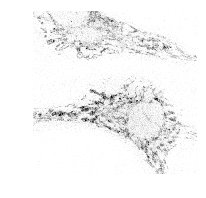

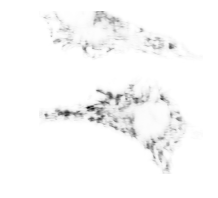

In [52]:
for oi, sri in zip(orig_images, sr_images):
    show_image(oi)
    show_image(sri)

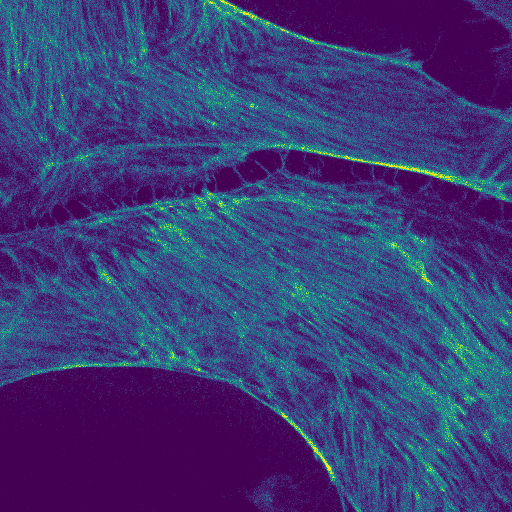

In [53]:
orig_images[0]

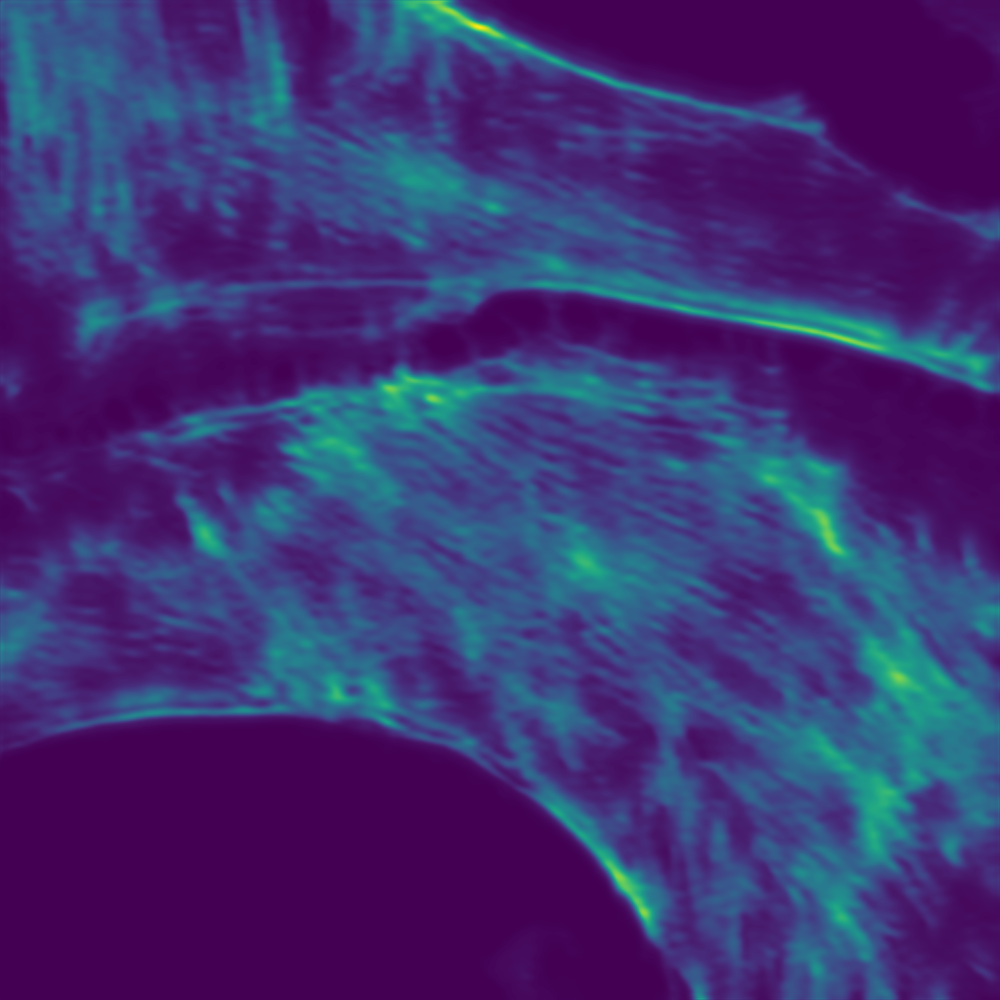

In [54]:
sr_images[0]

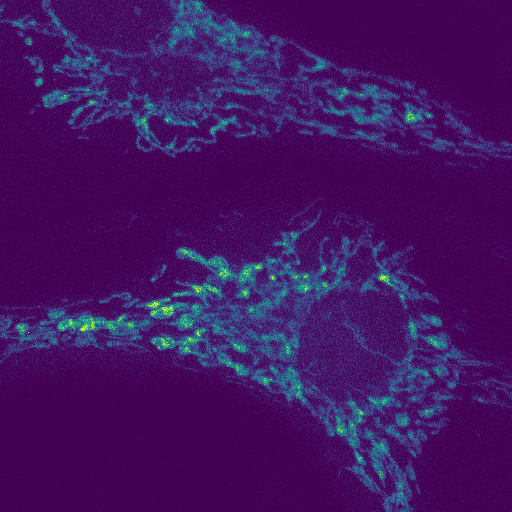

In [55]:
orig_images[1]

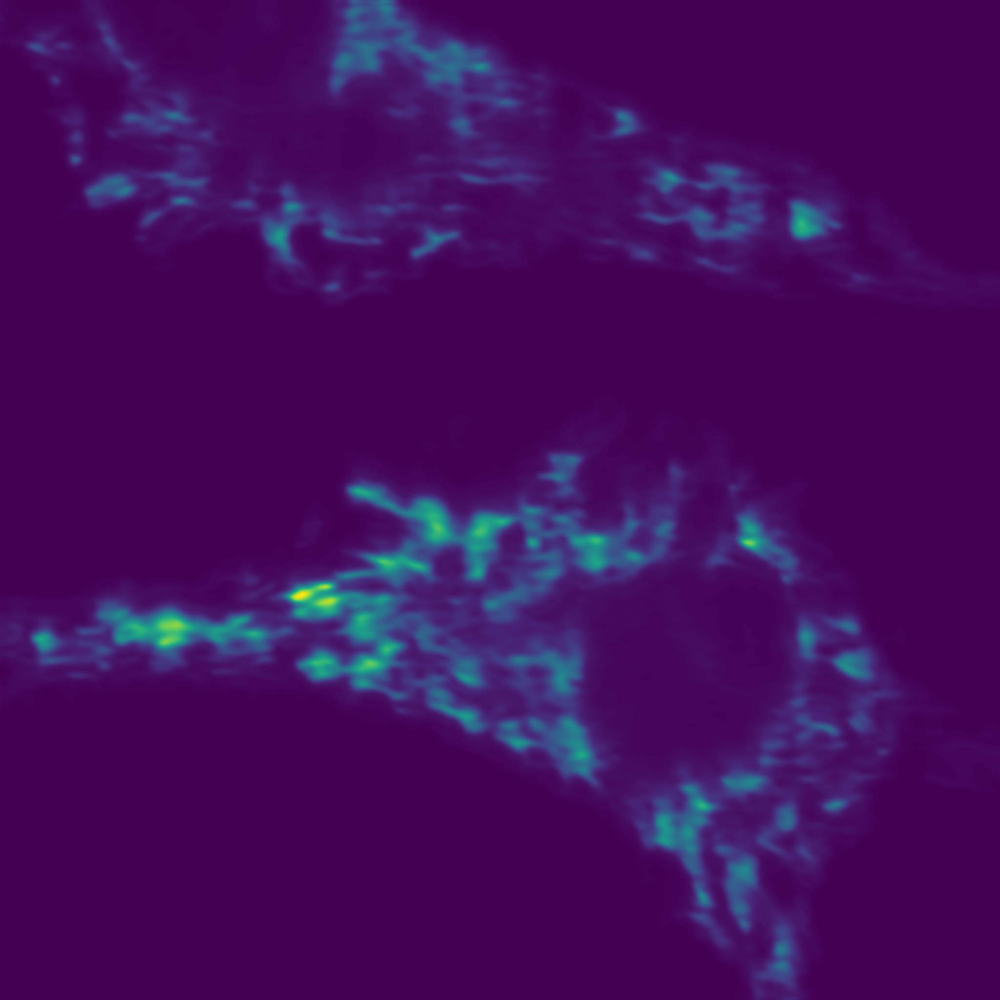

In [56]:
sr_images[1]

In [80]:
bs = 4
lr_sz = 506
lr = 1e-2
data = get_data(src, bs, lr_sz, scale=scale)
learn = Learner(data, model, loss_func=combo_loss, metrics=metrics).load('enhance-db-3.1')
preds, ys = learn.get_preds(DatasetType.Valid)

In [81]:
ys_dn = learn.data.denorm(ys)
preds_dn = learn.data.denorm(preds)

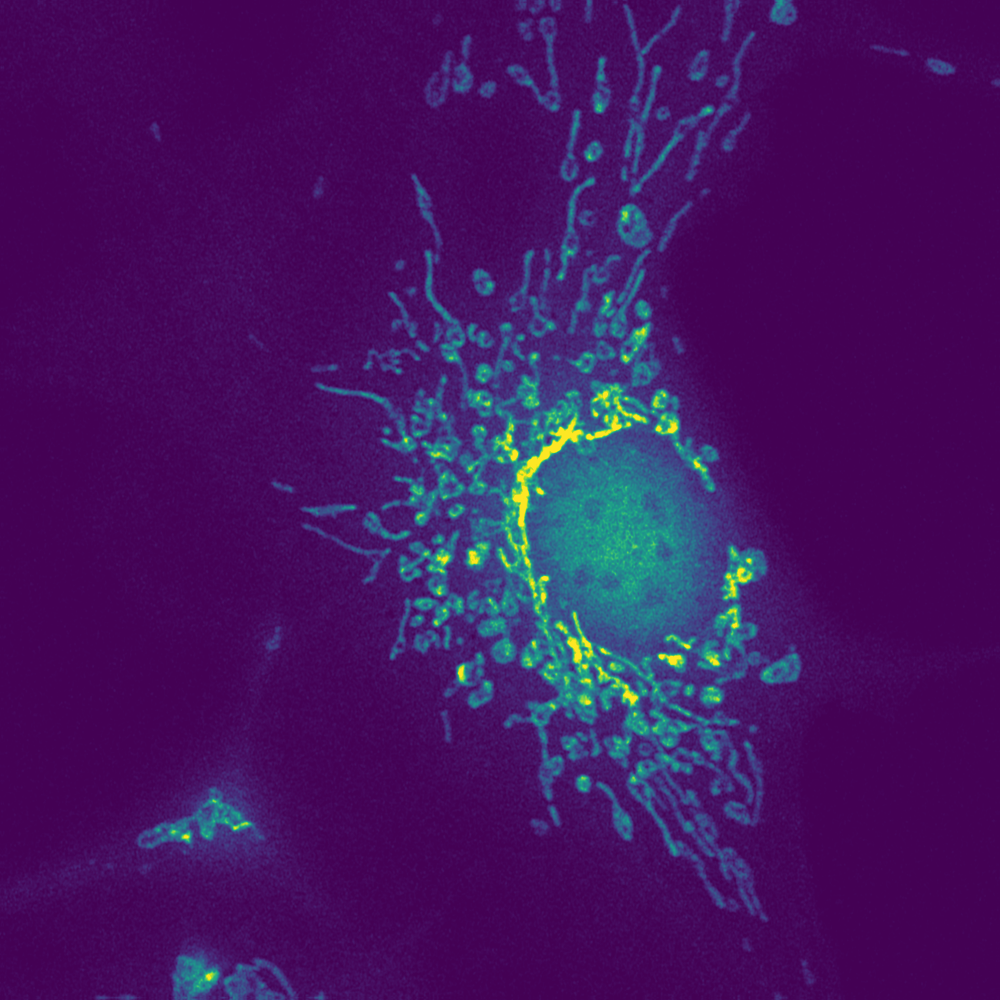

In [82]:
hr = Image(ys_dn[15])
hr

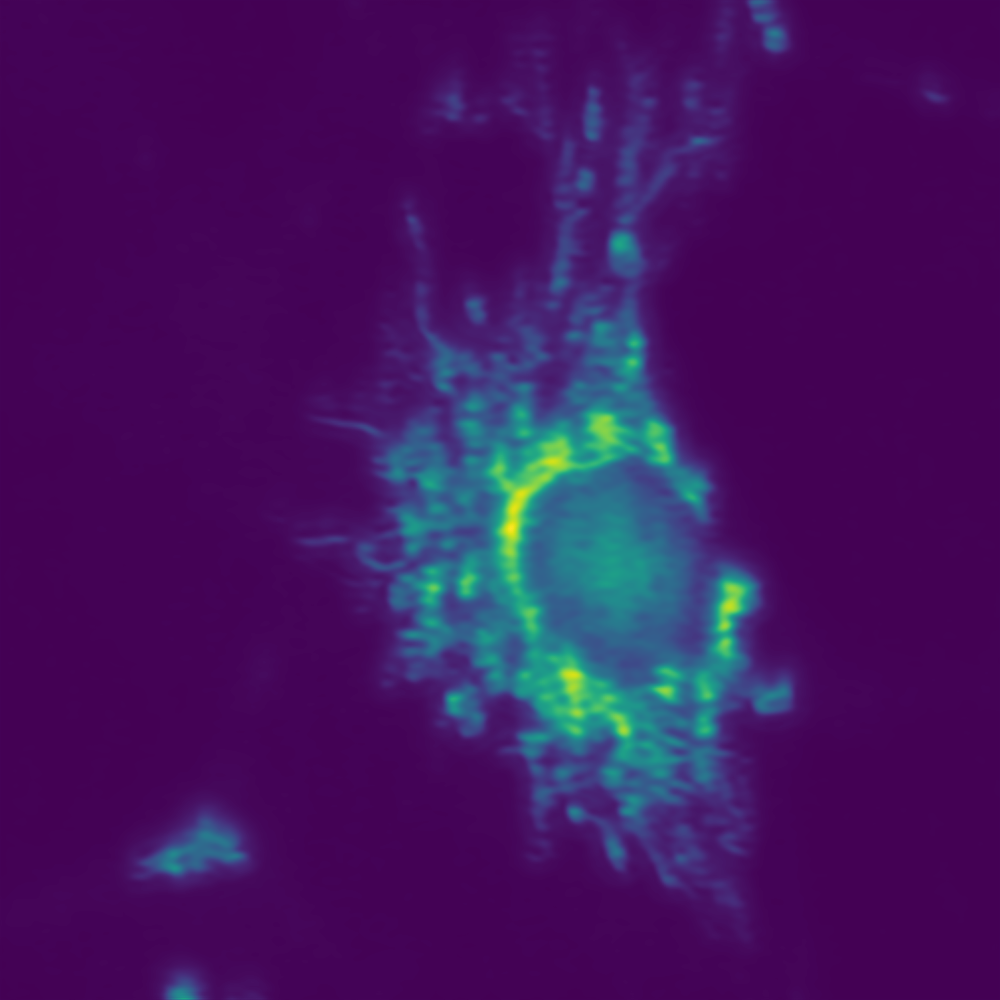

In [83]:
sr = Image(preds[15])
sr

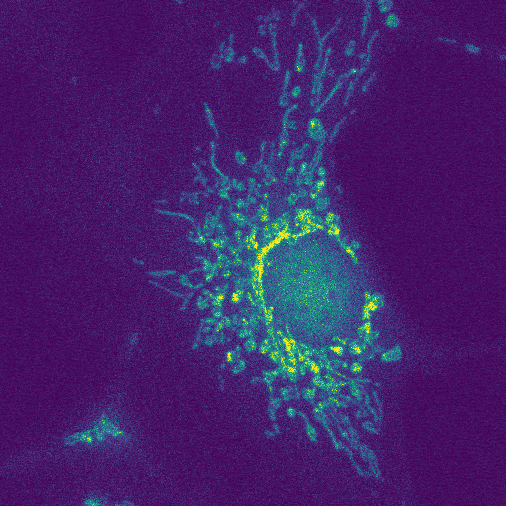

In [84]:
lr = learn.data.valid_ds[15][0]
lr

In [86]:
ssim_loss(sr.data[None],hr.data[None])

tensor(0.0464)